In [ ]:
import os
import glob
import numpy as np
import cv2
import tensorflow as tf
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
from sklearn.metrics import classification_report, confusion_matrix
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.applications.mobilenet_v2 import preprocess_input
from tensorflow.keras.preprocessing.image import ImageDataGenerator
! pip install split-folders
import splitfolders
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras.models import load_model

# --- Hyperparameters and Constants ---
IMG_SIZE = 224
BATCH_SIZE = 21
EPOCHS_STAGE_1 = 10
EPOCHS_FINE_TUNE = 10 
PROJECT_REPO = 'https://github.com/Sulieman25/Deep-Learning-Project.git'
PROJECT_DIR_NAME = 'Deep-Learning-Project'


✅ All libraries imported and hyperparameters defined.


In [ ]:
# init LFS
%cd /content
!apt-get install git-lfs
!git lfs install

# Clone and Pull LFS files
print("--- Starting Clone and LFS Pull ---")
!git clone {PROJECT_REPO}
%cd {PROJECT_DIR_NAME}
# This command pulls the actual large files (images and the .txt file)
!git lfs pull
%cd /content

# Define the Paths
PROJECT_DIR = os.path.join('/content', PROJECT_DIR_NAME)
DATA_DIR = os.path.join(PROJECT_DIR, 'data')
IMAGE_DATA_DIR = os.path.join(DATA_DIR, 'animals', 'animals')
CLASS_NAMES_FILE ="/content/Deep-Learning-Project/data/name of the animals.txt"
print("Files pulled successfully")

/content
Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
git-lfs is already the newest version (3.0.2-1ubuntu0.3).
0 upgraded, 0 newly installed, 0 to remove and 41 not upgraded.
Git LFS initialized.

--- Starting Clone and LFS Pull ---
Cloning into 'Deep-Learning-Project'...
remote: Enumerating objects: 5594, done.
remote: Counting objects: 100% (80/80), done.
remote: Compressing objects: 100% (77/77), done.
remote: Total 5594 (delta 0), reused 0 (delta 0), pack-reused 5514 (from 1)
Receiving objects: 100% (5594/5594), 656.18 MiB | 44.14 MiB/s, done.
Resolving deltas: 100% (4/4), done.
Updating files: 100% (5400/5400), done.
/content/Deep-Learning-Project
/content
✅ Files pulled successfully and local paths defined.


In [3]:

with open(CLASS_NAMES_FILE, 'r', encoding='utf-8') as file:
    class_names = [line.strip() for line in file.readlines()]

new_dir = os.path.join(DATA_DIR,"splitted")
NUM_CLASSES = len(class_names)
print(f"Successfully loaded {NUM_CLASSES} classes")

# split the data to 3 folders(train,val,test)
splitfolders.ratio(
    IMAGE_DATA_DIR,
    output =new_dir ,
    seed = 42,
    ratio=(0.7,0.2,0.1),
    group_prefix=None
)

datagen_train = ImageDataGenerator(
    preprocessing_function=preprocess_input, 
    rotation_range=20,
    width_shift_range=0.15,
    height_shift_range=0.15,
    shear_range=0.1,
    zoom_range=0.1,
    horizontal_flip=True,
)

datagen_val = ImageDataGenerator(
    preprocessing_function=preprocess_input,
)

datagen_test = ImageDataGenerator(
     preprocessing_function=preprocess_input
)


✅ Successfully loaded 90 classes.


Copying files: 5399 files [00:04, 1171.29 files/s]


In [ ]:
train_generator = datagen_train.flow_from_directory(
    directory=os.path.join(new_dir,"train"),
    classes=class_names,
    target_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    shuffle=True,
    seed=42
)

val_generator = datagen_val.flow_from_directory(
    directory=os.path.join(new_dir,"val"),
    classes=class_names,
    target_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    shuffle=True,
    seed=42
)

test_generator = datagen_test.flow_from_directory(
    directory = os.path.join(new_dir,"test"),
    classes=class_names,
    target_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    shuffle=False,
    seed=42
)

Found 3779 images belonging to 90 classes.
Found 1079 images belonging to 90 classes.
Found 541 images belonging to 90 classes.
✅ Data Generators created.


* Parameters for ImageDataGenerator :
1. preprocessing_function = preprocess_input -> The most frequent use is when you are using pre-trained models (like VGG16, ResNet50, MobileNet). 
These models require images to be preprocessed in a very specific way (e.g., converting RGB to BGR, zero-centering each color channel with respect to the ImageNet dataset).
2. rotation_range -> Randomly rotates the image clockwise or counter-clockwise by up to 20 degrees
3. width_shift_range -> Randomly shifts the image left/right by up to 15% of the image's total width
4. height_shift_range -> Randomly shifts the image up/down by up to 15% of the image's total hieght
5. validation_split -> It reserves 20% of the data strictly for validation
-----------------------------------------------------------------------------------------------------------
-----------------------------------------------------------------------------------------------------------
* Parameters for flow_from_directory :
1. directory -> The path to the main folder containing the data 
2. target_size -> Resizes every image to fit the model(224,224)
3. batch_size -> How many images to check at once 
4. class_mode -> This formats the labels as One-Hot Encoded vectors to match the output of the softmax


In [ ]:
# Load Base Model (Freezing the body)
base_model = MobileNetV2(
    weights='imagenet',
    include_top=False,
    input_shape=(IMG_SIZE, IMG_SIZE, 3)
)
base_model.trainable = False

# Add Classification Head
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(512, activation='relu')(x)
x = Dropout(0.4)(x)
predictions = Dense(NUM_CLASSES, activation='softmax')(x)
model = Model(inputs=base_model.input, outputs=predictions)

print("MobileNetV2 model built with custom classification head")

# Compile and Train Stage 1
model.compile(
    optimizer=Adam(learning_rate=0.001),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

checkpoint = ModelCheckpoint(
    filepath='best_mobilenet_without_fine_tuning.keras',
    monitor='val_loss',                
    save_best_only=True,                
    mode='min',                         
    verbose=0                           
)

history = model.fit(
    train_generator,
    validation_data=val_generator,
    epochs=EPOCHS_STAGE_1,
    verbose=1,
    callbacks=[checkpoint]
)

9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
✅ MobileNetV2 model built with custom classification head.

--- Starting Stage 1: Initial Training (Train Head Only) ---


/usr/local/lib/python3.12/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/10
180/180 ━━━━━━━━━━━━━━━━━━━━ 111s 525ms/step - accuracy: 0.2912 - loss: 3.3696 - val_accuracy: 0.8026 - val_loss: 0.7905
Epoch 2/10
180/180 ━━━━━━━━━━━━━━━━━━━━ 69s 383ms/step - accuracy: 0.7565 - loss: 0.8842 - val_accuracy: 0.8452 - val_loss: 0.5949
Epoch 3/10
180/180 ━━━━━━━━━━━━━━━━━━━━ 67s 375ms/step - accuracy: 0.8191 - loss: 0.6411 - val_accuracy: 0.8517 - val_loss: 0.5520
Epoch 4/10
180/180 ━━━━━━━━━━━━━━━━━━━━ 69s 382ms/step - accuracy: 0.8519 - loss: 0.4863 - val_accuracy: 0.8591 - val_loss: 0.5454
Epoch 5/10
180/180 ━━━━━━━━━━━━━━━━━━━━ 67s 374ms/step - accuracy: 0.8753 - loss: 0.3988 - val_accuracy: 0.8462 - val_loss: 0.5673
Epoch 6/10
180/180 ━━━━━━━━━━━━━━━━━━━━ 68s 376ms/step - accuracy: 0.8905 - loss: 0.3434 - val_accuracy: 0.8489 - val_loss: 0.5713
Epoch 7/10
180/180 ━━━━━━━━━━━━━━━━━━━━ 68s 380ms/step - accuracy: 0.9080 - loss: 0.2914 - val_accuracy: 0.8554 - val_loss: 0.5905
Epoch 8/10
180/180 ━━━━━━━━━━━━━━━━━━━━ 68s 376ms/step - accuracy: 0.9109 - loss: 

In [ ]:
best_model = load_model('best_mobilenet_without_fine_tuning.keras')

print("Best model loaded successfully.")

val_loss, val_accuracy = best_model.evaluate(val_generator)

print("--- Best Model Performance ---")
print(f"Validation Loss:     {val_loss:.4f}")
print(f"Validation Accuracy: {val_accuracy*100:.2f}%")

✅ Best model loaded successfully.
52/52 ━━━━━━━━━━━━━━━━━━━━ 14s 179ms/step - accuracy: 0.8766 - loss: 0.4618

--- Best Model Performance ---
Validation Loss:     0.5213
Validation Accuracy: 86.84%


Fine-Tuning

In [ ]:
# 1. Unfreeze and Freeze specific layers
base_model.trainable = True

# Freeze the bottom 100 layers (for stable feature extraction)
for layer in base_model.layers[:100]:
    layer.trainable = False

# 2. Re-compile with a very low learning rate
model.compile(
    optimizer=Adam(learning_rate=0.00001),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

TOTAL_EPOCHS = EPOCHS_STAGE_1 + EPOCHS_FINE_TUNE

print(f"--- Starting Stage 2: Fine-Tuning (Epochs {EPOCHS_STAGE_1+1}-{TOTAL_EPOCHS}) ---")

checkpoint = ModelCheckpoint(
    filepath='best_mobilenet_with_fine_tuning.keras',
    monitor='val_loss',                
    save_best_only=True,                
    mode='min',                         
    verbose=0                           
)

history_fine_tune = model.fit(
    train_generator,
    validation_data=val_generator,
    epochs=TOTAL_EPOCHS,
    initial_epoch=history.epoch[-1] + 1,
    verbose=1,
    callbacks=[checkpoint]
)

print("--- Training Complete ---")


--- Starting Stage 2: Fine-Tuning (Epochs 11-20) ---
Epoch 11/20
180/180 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step - accuracy: 0.9497 - loss: 0.1570
Epoch 11: val_loss improved from inf to 0.51621, saving model to best_mobilenet_with_fine_tuning.keras
180/180 ━━━━━━━━━━━━━━━━━━━━ 88s 435ms/step - accuracy: 0.9497 - loss: 0.1569 - val_accuracy: 0.8740 - val_loss: 0.5162
Epoch 12/20
180/180 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step - accuracy: 0.9564 - loss: 0.1420
Epoch 12: val_loss improved from 0.51621 to 0.51002, saving model to best_mobilenet_with_fine_tuning.keras
180/180 ━━━━━━━━━━━━━━━━━━━━ 68s 376ms/step - accuracy: 0.9564 - loss: 0.1420 - val_accuracy: 0.8758 - val_loss: 0.5100
Epoch 13/20
180/180 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step - accuracy: 0.9554 - loss: 0.1314
Epoch 13: val_loss improved from 0.51002 to 0.50461, saving model to best_mobilenet_with_fine_tuning.keras
180/180 ━━━━━━━━━━━━━━━━━━━━ 72s 401ms/step - accuracy: 0.9554 - loss: 0.1314 - val_accuracy: 0.8777 - val_loss: 0.5046
Ep

In [ ]:
print("Best model loaded successfully.")

val_loss, val_accuracy = model.evaluate(val_generator)

print("--- Model Performance ---")
print(f"Validation Loss:     {val_loss:.4f}")
print(f"Validation Accuracy: {val_accuracy*100:.2f}%")

✅ Best model loaded successfully.
52/52 ━━━━━━━━━━━━━━━━━━━━ 6s 108ms/step - accuracy: 0.8648 - loss: 0.6040

--- Model Performance ---
Validation Loss:     0.5002
Validation Accuracy: 87.95%



--- Generating Predictions... ---
26/26 ━━━━━━━━━━━━━━━━━━━━ 18s 538ms/step

--- Detailed Classification Report ---
                precision    recall  f1-score   support

      antelope       0.71      0.83      0.77         6
        badger       1.00      1.00      1.00         6
           bat       0.71      0.83      0.77         6
          bear       0.83      0.83      0.83         6
           bee       1.00      0.83      0.91         6
        beetle       0.71      0.83      0.77         6
         bison       1.00      1.00      1.00         6
          boar       0.71      0.83      0.77         6
     butterfly       1.00      0.67      0.80         6
           cat       0.75      0.86      0.80         7
   caterpillar       1.00      0.83      0.91         6
    chimpanzee       1.00      1.00      1.00         6
     cockroach       0.83      0.83      0.83         6
           cow       0.50      0.67      0.57         6
        coyote       0.86      1.00      0

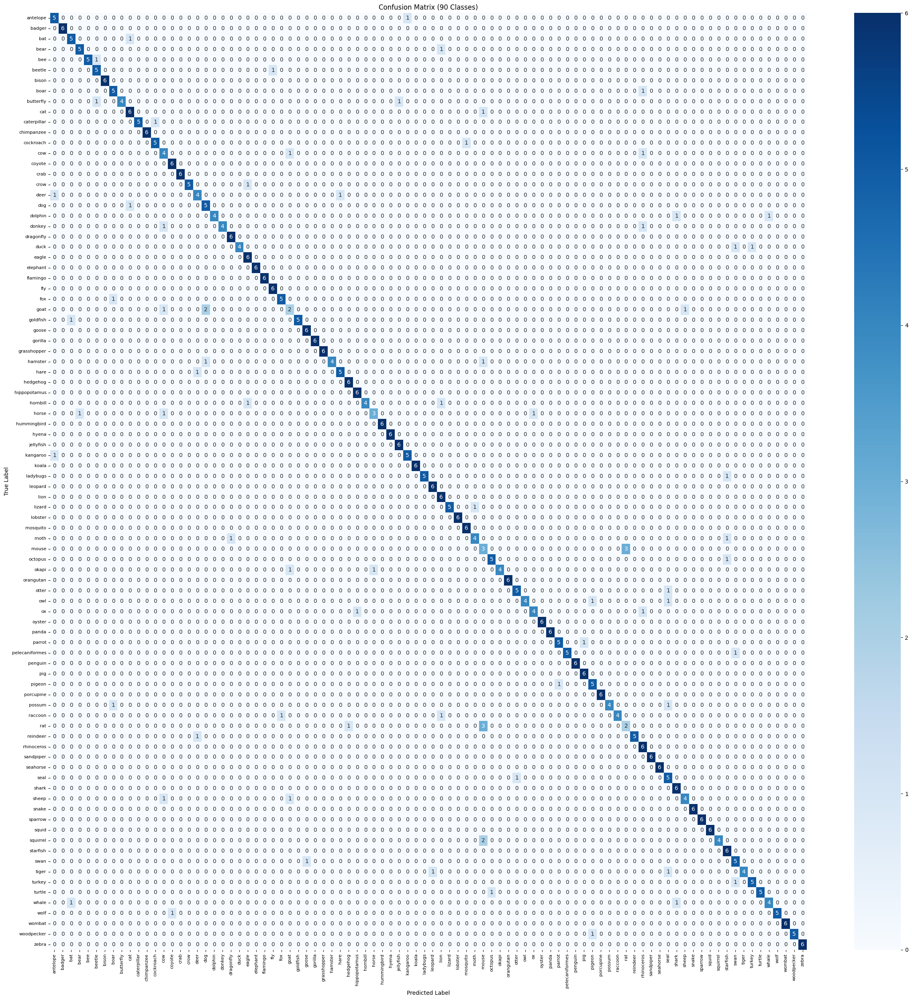

In [ ]:
test_generator.reset()

Y_pred_one_hot_eval = model.predict(test_generator, verbose=1)

Y_pred_indices = np.argmax(Y_pred_one_hot_eval, axis=1)

Y_true_indices = test_generator.classes

print("--- Detailed Classification Report ---")
print(classification_report(
    Y_true_indices,
    Y_pred_indices,
    target_names=class_names,
    zero_division=0
))

# Confusion Matrix
conf_matrix = confusion_matrix(Y_true_indices, Y_pred_indices)

plt.figure(figsize=(25, 25))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues',
            xticklabels=class_names, yticklabels=class_names)
plt.title('Confusion Matrix (90 Classes)')
plt.ylabel('True Label')
plt.xlabel('Predicted Label')
plt.xticks(rotation=90, fontsize=8)
plt.yticks(rotation=0, fontsize=8)
plt.tight_layout() 
plt.show()

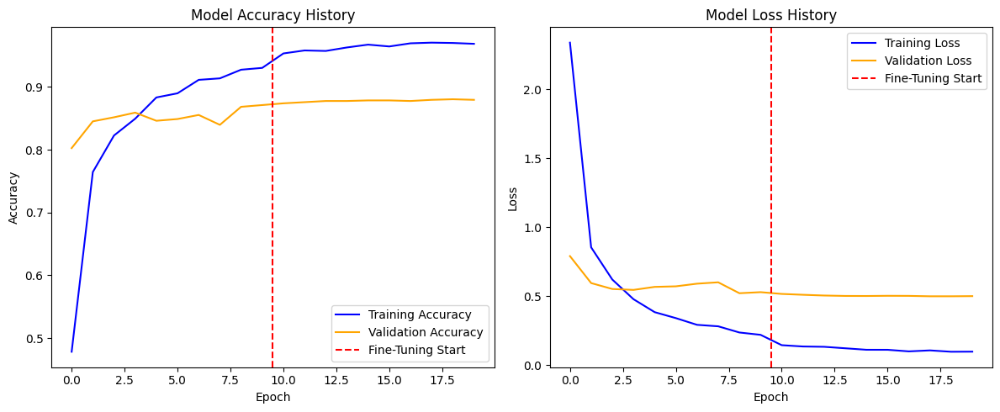

In [ ]:
#Accuracy and Loss Curves
hist_df = pd.DataFrame(history.history)
hist_fine_tune_df = pd.DataFrame(history_fine_tune.history)
hist_fine_tune_df.index = hist_fine_tune_df.index + len(hist_df)
combined_history_df = pd.concat([hist_df, hist_fine_tune_df])

plt.figure(figsize=(12, 5))

# Accuracy Plot
plt.subplot(1, 2, 1)
plt.plot(combined_history_df['accuracy'], label='Training Accuracy', color='blue')
plt.plot(combined_history_df['val_accuracy'], label='Validation Accuracy', color='orange')
plt.axvline(x=len(hist_df)-0.5, color='red', linestyle='--', label='Fine-Tuning Start')
plt.title('Model Accuracy History')
plt.legend(loc='lower right')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')

# Loss Plot
plt.subplot(1, 2, 2)
plt.plot(combined_history_df['loss'], label='Training Loss', color='blue')
plt.plot(combined_history_df['val_loss'], label='Validation Loss', color='orange')
plt.axvline(x=len(hist_df)-0.5, color='red', linestyle='--', label='Fine-Tuning Start')
plt.title('Model Loss History')
plt.legend(loc='upper right')
plt.xlabel('Epoch')
plt.ylabel('Loss')

plt.tight_layout()
plt.show()

Found 541 images belonging to 90 classes.


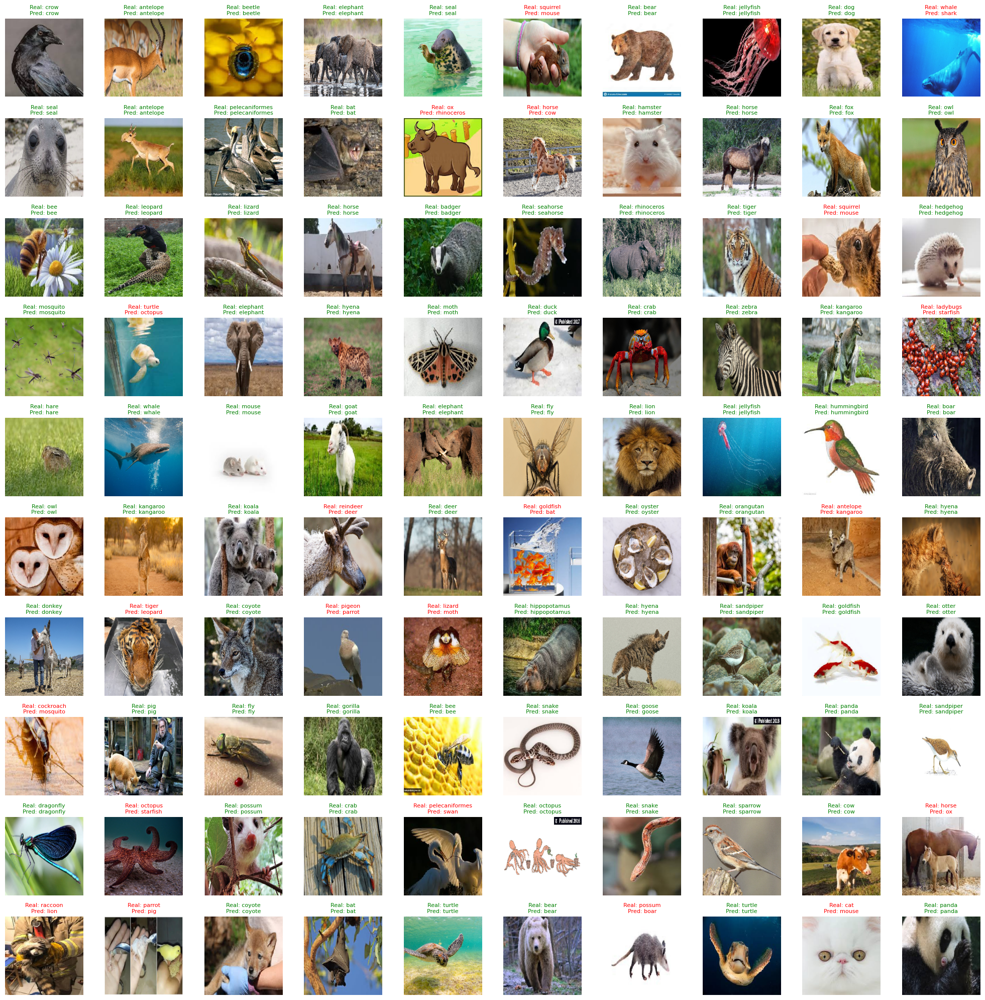

In [ ]:
temp_datagen = ImageDataGenerator(
    preprocessing_function=preprocess_input
)

temp_generator = temp_datagen.flow_from_directory(
    directory=os.path.join(new_dir, "test"),
    classes=class_names,
    target_size=(IMG_SIZE, IMG_SIZE),
    batch_size=100,      
    class_mode='categorical',
    shuffle=True 
)

images, labels = next(temp_generator)

predictions = model.predict(images, verbose=0)

true_ids = np.argmax(labels, axis=1)
pred_ids = np.argmax(predictions, axis=1)

plt.figure(figsize=(20, 20))
rows = 10
columns = 10


for i in range(100):
    plt.subplot(rows, columns, i + 1) 
    
    img_to_show = (images[i] + 1) / 2
    plt.imshow(img_to_show)
    plt.axis('off')
    
    is_correct = (true_ids[i] == pred_ids[i])
    text_color = 'green' if is_correct else 'red'
    
    real_name = class_names[true_ids[i]]
    pred_name = class_names[pred_ids[i]]
    
    plt.title(f"Real: {real_name}\nPred: {pred_name}", color=text_color, fontsize=8)

plt.tight_layout()
plt.show()

In [ ]:
resnet_preprocess = tf.keras.applications.resnet50.preprocess_input

datagen_train_resnet = ImageDataGenerator(
    preprocessing_function=resnet_preprocess,
    rotation_range=20,
    width_shift_range=0.15,
    height_shift_range=0.15,
    shear_range=0.1,
    zoom_range=0.1,
    horizontal_flip=True,
)

datagen_val_resnet = ImageDataGenerator(
    preprocessing_function=resnet_preprocess,
)

datagen_test_resnet = ImageDataGenerator(
    preprocessing_function=resnet_preprocess,
)

resnet_train_gen = datagen_train_resnet.flow_from_directory(
    directory=os.path.join(new_dir,"train"),
    classes=class_names,
    target_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    shuffle=True,
    seed=42
)

resnet_val_gen = datagen_val_resnet.flow_from_directory(
    directory=os.path.join(new_dir,"val"),
    classes=class_names,
    target_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    shuffle=True,
    seed=42
)

resnet_test_gen = datagen_test_resnet.flow_from_directory(
    directory=os.path.join(new_dir,"test"),
    classes=class_names,
    target_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    shuffle=False,
    seed=42
)

resnet_base = tf.keras.applications.ResNet50(
    weights='imagenet',
    include_top=False,
    input_shape=(IMG_SIZE, IMG_SIZE, 3)
)
resnet_base.trainable = False  # freeze base for stage 1

# Classification head
y = resnet_base.output
y = GlobalAveragePooling2D()(y)
y = Dense(512, activation='relu')(y)
y = Dropout(0.4)(y)
resnet_predictions = Dense(NUM_CLASSES, activation='softmax')(y)
resnet_model = Model(inputs=resnet_base.input, outputs=resnet_predictions)

print("ResNet50 model built with custom classification head")



--- Starting ResNet50 Setup and Training ---
Found 3779 images belonging to 90 classes.
Found 1079 images belonging to 90 classes.
Found 541 images belonging to 90 classes.
94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
✅ ResNet50 model built with custom classification head.


In [ ]:
resnet_model.compile(
    optimizer=Adam(learning_rate=0.001),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)



print("--- ResNet Stage 1: Training Head Only ---")

checkpoint = ModelCheckpoint(
    filepath='best_resnet_without_fine_tuning.keras',
    monitor='val_loss',                
    save_best_only=True,                
    mode='min',                         
    verbose=0                           
)


resnet_history = resnet_model.fit(
    resnet_train_gen,
    validation_data=resnet_val_gen,
    epochs=EPOCHS_STAGE_1,
    verbose=1,
    callbacks=[checkpoint]

)

best_model = load_model('best_resnet_without_fine_tuning.keras')

print("Best model loaded successfully")

val_loss, val_accuracy = best_model.evaluate(resnet_val_gen)

print("--- Best Model Performance ---")
print(f"Validation Loss:     {val_loss:.4f}")
print(f"Validation Accuracy: {val_accuracy*100:.2f}%")



--- ResNet Stage 1: Training Head Only ---


/usr/local/lib/python3.12/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/10
180/180 ━━━━━━━━━━━━━━━━━━━━ 98s 473ms/step - accuracy: 0.2398 - loss: 3.5385 - val_accuracy: 0.7841 - val_loss: 0.8235
Epoch 2/10
180/180 ━━━━━━━━━━━━━━━━━━━━ 122s 396ms/step - accuracy: 0.7181 - loss: 1.0409 - val_accuracy: 0.8443 - val_loss: 0.5851
Epoch 3/10
180/180 ━━━━━━━━━━━━━━━━━━━━ 72s 397ms/step - accuracy: 0.8037 - loss: 0.6629 - val_accuracy: 0.8452 - val_loss: 0.5578
Epoch 4/10
180/180 ━━━━━━━━━━━━━━━━━━━━ 72s 399ms/step - accuracy: 0.8431 - loss: 0.4996 - val_accuracy: 0.8563 - val_loss: 0.5071
Epoch 5/10
180/180 ━━━━━━━━━━━━━━━━━━━━ 72s 398ms/step - accuracy: 0.8595 - loss: 0.4319 - val_accuracy: 0.8684 - val_loss: 0.5035
Epoch 6/10
180/180 ━━━━━━━━━━━━━━━━━━━━ 72s 398ms/step - accuracy: 0.9006 - loss: 0.3357 - val_accuracy: 0.8638 - val_loss: 0.4967
Epoch 7/10
180/180 ━━━━━━━━━━━━━━━━━━━━ 71s 392ms/step - accuracy: 0.9022 - loss: 0.3039 - val_accuracy: 0.8536 - val_loss: 0.5193
Epoch 8/10
180/180 ━━━━━━━━━━━━━━━━━━━━ 71s 392ms/step - accuracy: 0.8956 - loss: 

In [ ]:
resnet_base.trainable = True

# Freeze bottom layers for stability
UNFREEZE_AT = 100
for layer in resnet_base.layers[:UNFREEZE_AT]:
    layer.trainable = False

# Re-compile with a low learning rate for fine-tuning
resnet_model.compile(
    optimizer=Adam(learning_rate=0.00001),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

# Fine-tune
TOTAL_EPOCHS_RESNET = EPOCHS_STAGE_1 + EPOCHS_FINE_TUNE
print(f"\n--- ResNet Stage 2: Fine-Tuning (Epochs {EPOCHS_STAGE_1+1}-{TOTAL_EPOCHS_RESNET}) ---")

checkpoint = ModelCheckpoint(
    filepath='best_resnet_with_fine_tuning.keras',
    monitor='val_loss',                
    save_best_only=True,                
    mode='min',                         
    verbose=0                           
)



resnet_history_fine_tune = resnet_model.fit(
    resnet_train_gen,
    validation_data=resnet_val_gen,
    epochs=TOTAL_EPOCHS_RESNET,
    initial_epoch=resnet_history.epoch[-1] + 1,
    verbose=1,
    callbacks=[checkpoint]
)



--- ResNet Stage 2: Fine-Tuning (Epochs 11-20) ---
Epoch 11/20
180/180 ━━━━━━━━━━━━━━━━━━━━ 121s 511ms/step - accuracy: 0.9107 - loss: 0.3059 - val_accuracy: 0.8814 - val_loss: 0.4711
Epoch 12/20
180/180 ━━━━━━━━━━━━━━━━━━━━ 79s 440ms/step - accuracy: 0.9424 - loss: 0.1932 - val_accuracy: 0.8860 - val_loss: 0.4606
Epoch 13/20
180/180 ━━━━━━━━━━━━━━━━━━━━ 80s 443ms/step - accuracy: 0.9368 - loss: 0.1850 - val_accuracy: 0.8823 - val_loss: 0.4580
Epoch 14/20
180/180 ━━━━━━━━━━━━━━━━━━━━ 82s 453ms/step - accuracy: 0.9588 - loss: 0.1300 - val_accuracy: 0.8897 - val_loss: 0.4550
Epoch 15/20
180/180 ━━━━━━━━━━━━━━━━━━━━ 73s 405ms/step - accuracy: 0.9616 - loss: 0.1265 - val_accuracy: 0.8906 - val_loss: 0.4551
Epoch 16/20
180/180 ━━━━━━━━━━━━━━━━━━━━ 100s 559ms/step - accuracy: 0.9702 - loss: 0.0962 - val_accuracy: 0.8916 - val_loss: 0.4492
Epoch 17/20
180/180 ━━━━━━━━━━━━━━━━━━━━ 79s 438ms/step - accuracy: 0.9737 - loss: 0.0884 - val_accuracy: 0.8851 - val_loss: 0.4474
Epoch 18/20
180/180 ━━

In [ ]:
best_model = load_model('best_resnet_with_fine_tuning.keras')

print("Best model loaded successfully")

val_loss, val_accuracy = best_model.evaluate(resnet_val_gen)

print("--- Best Model Performance ---")
print(f"Validation Loss:     {val_loss:.4f}")
print(f"Validation Accuracy: {val_accuracy*100:.2f}%")

✅ Best model loaded successfully.
52/52 ━━━━━━━━━━━━━━━━━━━━ 14s 170ms/step - accuracy: 0.8766 - loss: 0.5223

--- Best Model Performance ---
Validation Loss:     0.4306
Validation Accuracy: 89.34%



--- Generating Predictions... ---
26/26 ━━━━━━━━━━━━━━━━━━━━ 3s 125ms/step

--- Detailed Classification Report ---
                precision    recall  f1-score   support

      antelope       0.71      0.83      0.77         6
        badger       0.86      1.00      0.92         6
           bat       0.57      0.67      0.62         6
          bear       0.86      1.00      0.92         6
           bee       1.00      0.67      0.80         6
        beetle       1.00      1.00      1.00         6
         bison       1.00      1.00      1.00         6
          boar       0.75      1.00      0.86         6
     butterfly       1.00      0.83      0.91         6
           cat       0.88      1.00      0.93         7
   caterpillar       1.00      1.00      1.00         6
    chimpanzee       1.00      1.00      1.00         6
     cockroach       1.00      1.00      1.00         6
           cow       0.83      0.83      0.83         6
        coyote       0.71      0.83      0.

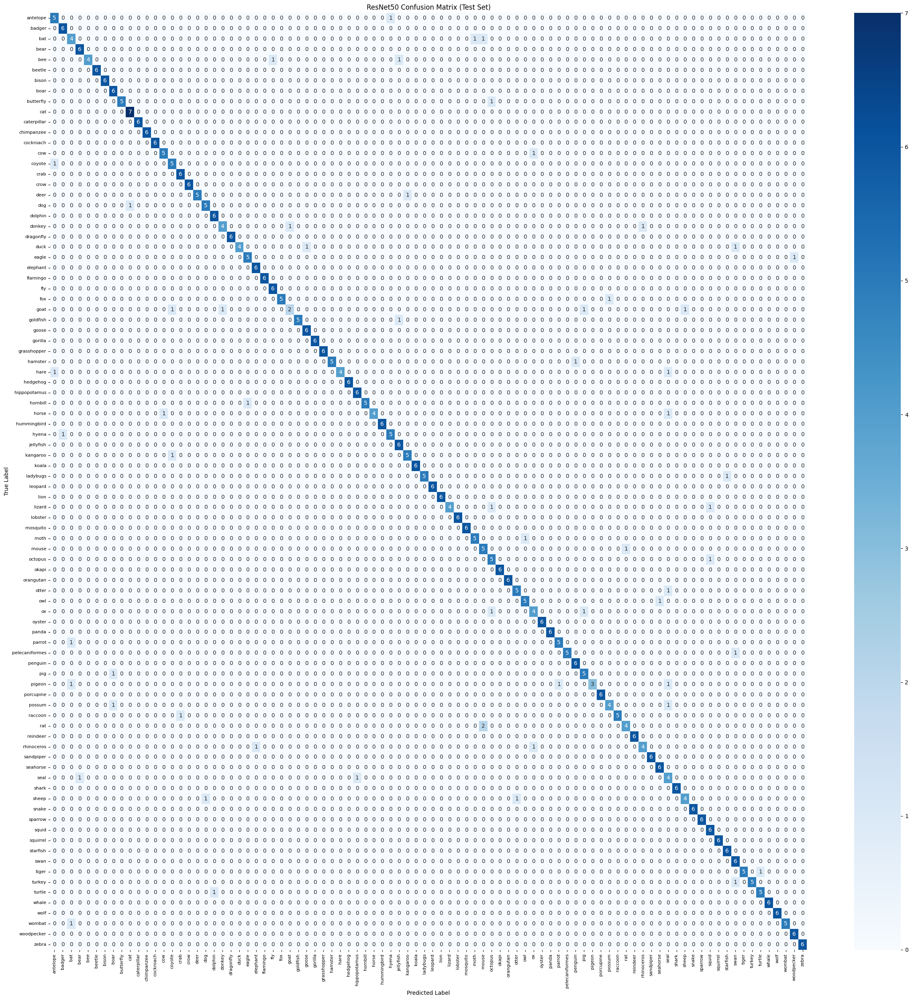

In [ ]:
print("\n--- Generating Predictions... ---")

resnet_test_gen.reset()

Y_pred = resnet_model.predict(resnet_test_gen, verbose=1)
y_pred_indices = np.argmax(Y_pred, axis=1)

y_true_indices = resnet_test_gen.classes

print("--- Detailed Classification Report ---")
print(classification_report(
    y_true_indices,
    y_pred_indices,
    target_names=class_names,
    zero_division=0
))

conf_matrix = confusion_matrix(y_true_indices, y_pred_indices)

plt.figure(figsize=(25, 25))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues',
            xticklabels=class_names, yticklabels=class_names)
plt.title('ResNet50 Confusion Matrix (Test Set)')
plt.ylabel('True Label')
plt.xlabel('Predicted Label')
plt.xticks(rotation=90, fontsize=8)
plt.yticks(rotation=0, fontsize=8)
plt.tight_layout()
plt.show()

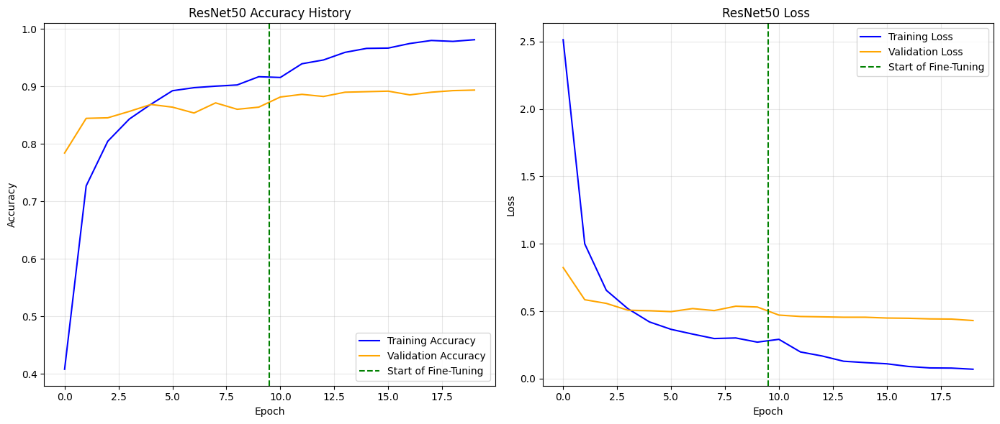

In [ ]:
hist_stage1 = pd.DataFrame(resnet_history.history)
hist_stage2 = pd.DataFrame(resnet_history_fine_tune.history)

hist_stage2.index = hist_stage2.index + len(hist_stage1)

combined_history_df = pd.concat([hist_stage1, hist_stage2])

plt.figure(figsize=(14, 6))

# Accuracy Plot
plt.subplot(1, 2, 1)
plt.plot(combined_history_df['accuracy'], label='Training Accuracy', color='blue')
plt.plot(combined_history_df['val_accuracy'], label='Validation Accuracy', color='orange')
plt.axvline(x=len(hist_stage1)-0.5, color='red', linestyle='--', label='Start of Fine-Tuning')
plt.title('ResNet50 Accuracy History')
plt.legend(loc='lower right')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.grid(True, alpha=0.3)

# Loss Plot
plt.subplot(1, 2, 2)
plt.plot(combined_history_df['loss'], label='Training Loss', color='blue')
plt.plot(combined_history_df['val_loss'], label='Validation Loss', color='orange')
plt.axvline(x=len(hist_stage1)-0.5, color='green', linestyle='--', label='Start of Fine-Tuning')
plt.title('ResNet50 Loss History')
plt.legend(loc='upper right')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

Found 541 images belonging to 90 classes.


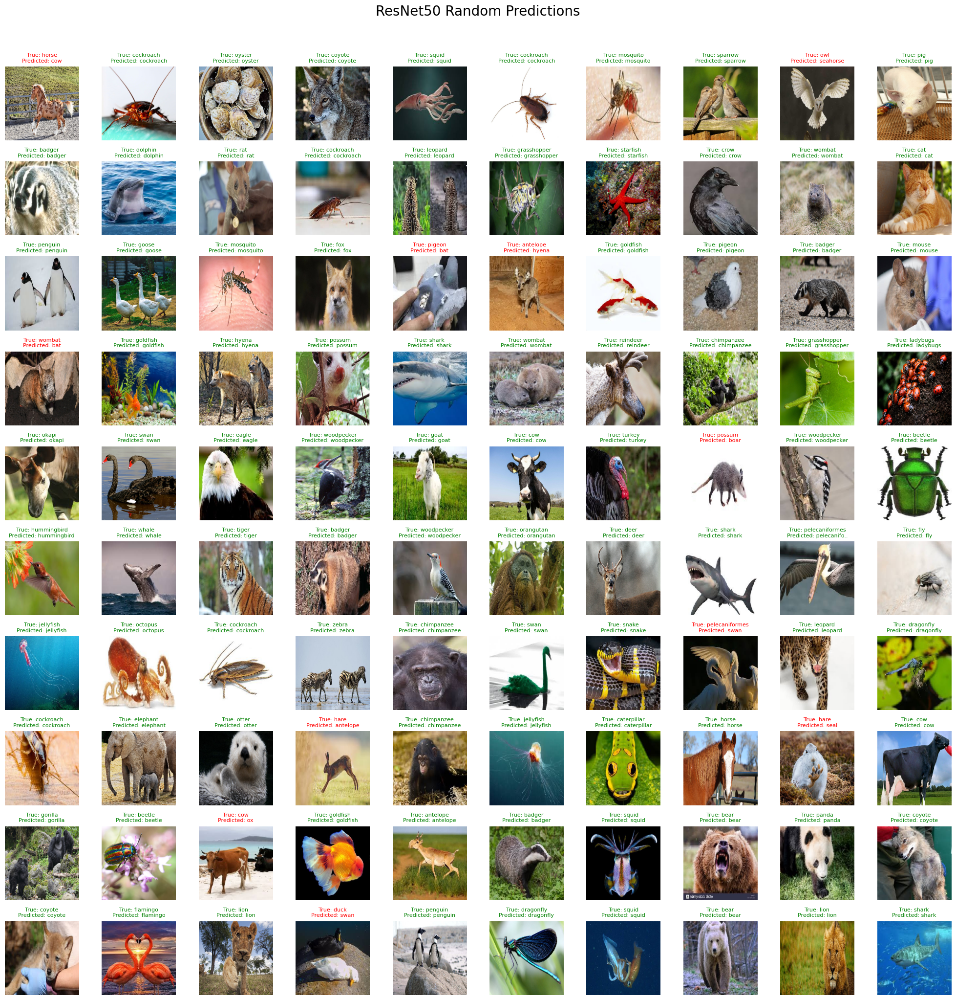

In [ ]:
viz_datagen = ImageDataGenerator(
    preprocessing_function=resnet_preprocess
)

viz_generator = viz_datagen.flow_from_directory(
    directory=os.path.join(new_dir, "test"),
    classes=class_names,
    target_size=(IMG_SIZE, IMG_SIZE),
    batch_size=100,
    class_mode='categorical',
    shuffle=True,
    seed=42
)

images, labels = next(viz_generator)

predictions = resnet_model.predict(images, verbose=0)

true_ids = np.argmax(labels, axis=1)
pred_ids = np.argmax(predictions, axis=1)


plt.figure(figsize=(20, 20))
plt.suptitle("ResNet50 Random Predictions", fontsize=20, y=1.02)

for i in range(100):
    plt.subplot(10, 10, i + 1)
    
    # Add the average color value back
    img_to_show = images[i] + [104, 117, 124]
    
    #Flip BGR to RGB
    img_to_show = img_to_show[:, :, ::-1]
    
    img_to_show = np.clip(img_to_show, 0, 255).astype('uint8')

    plt.imshow(img_to_show)
    plt.axis('off')
    
    is_correct = (true_ids[i] == pred_ids[i])
    color = 'green' if is_correct else 'red'
    
    real_name = class_names[true_ids[i]]
    pred_name = class_names[pred_ids[i]]
    
    plt.title(f"True: {real_name}\nPredicted: {pred_name}", color=color, fontsize=8)

plt.tight_layout()
plt.show()